In [1]:
from langdetect import detect
from top2vec import Top2Vec
from nltk import tokenize
import pandas as pd
import numpy as np
import re

In [2]:
data = pd.read_csv("all_data.csv")
data = pd.DataFrame(data.iloc[:,1:8])

In [3]:
#Make a list of the descriptions
documents = data["Description"].astype(str).values.tolist()
#documents["Description"] = documents["Description"].astype(str)
#Make list of string, instead of list of lists
#documents = [''.join(ele) for ele in documents]
#replace \n with a space for all documents
documents = [re.sub('\n', ' ', i) for i in documents]


In [9]:
#Detect languages of all documents, sort out the english ones
lan = [detect(desc) for desc in documents]
indices = [i for i, s in enumerate(lan) if 'en' in s]
en_docs = [documents[index] for index in indices]

In [15]:
#Turn the list of documents into list of sentences
docs = [tokenize.sent_tokenize(text) for text in en_docs]
docs = [item for sublist in docs for item in sublist]

In [25]:
model = Top2Vec(docs, speed="deep-learn", workers = 10)

2023-02-10 08:25:25,878 - top2vec - INFO - Pre-processing documents for training
2023-02-10 08:25:26,468 - top2vec - INFO - Creating joint document/word embedding
2023-02-10 08:30:51,439 - top2vec - INFO - Creating lower dimension embedding of documents
2023-02-10 08:30:57,079 - top2vec - INFO - Finding dense areas of documents
2023-02-10 08:30:58,009 - top2vec - INFO - Finding topics


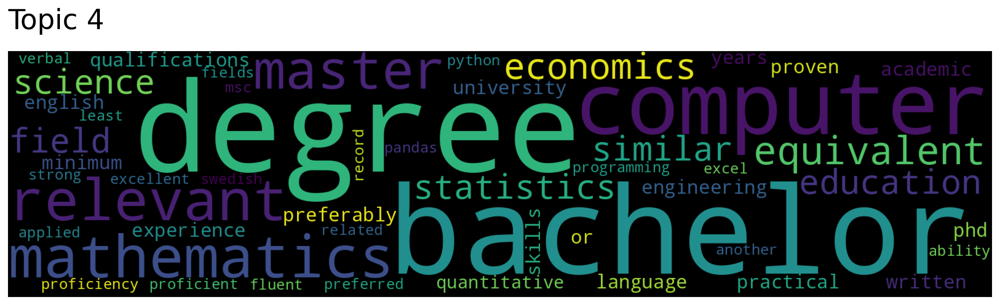

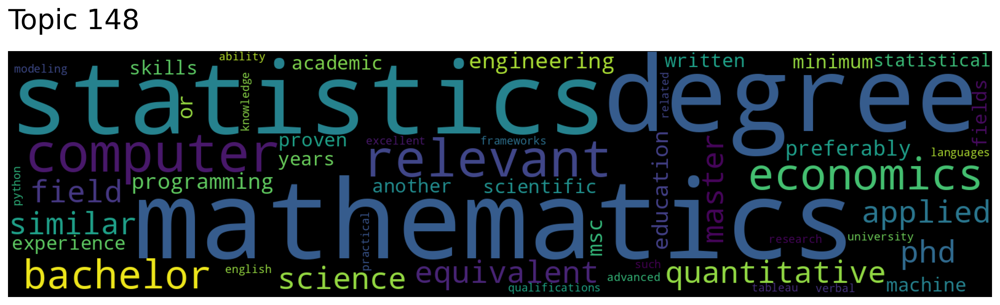

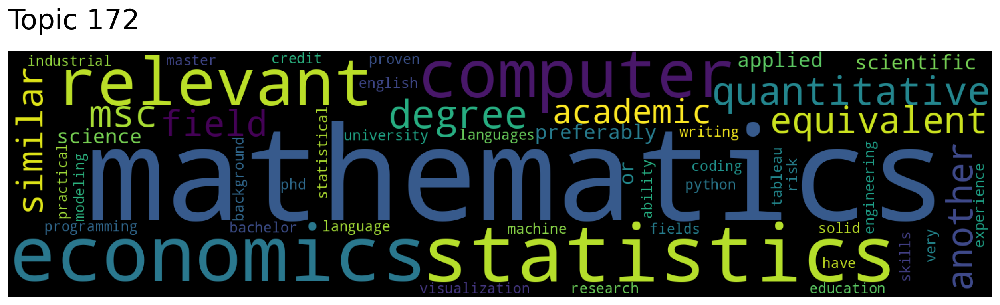

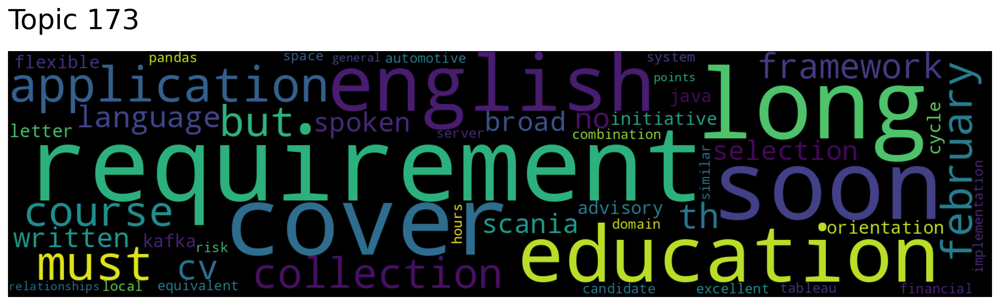

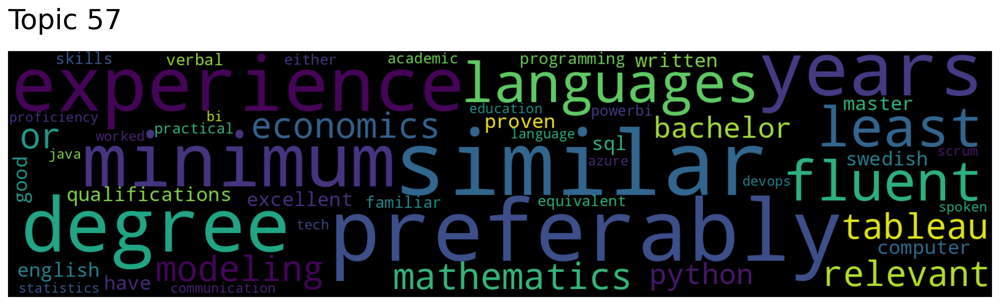

In [46]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["education"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

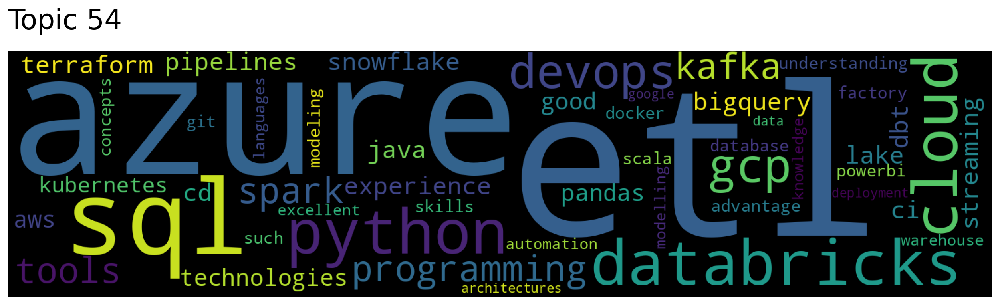

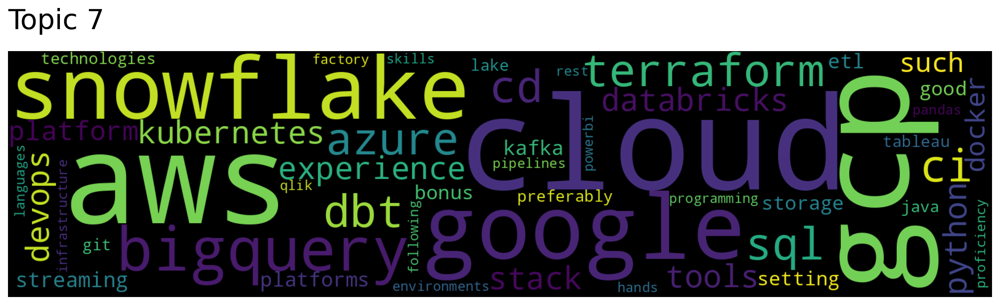

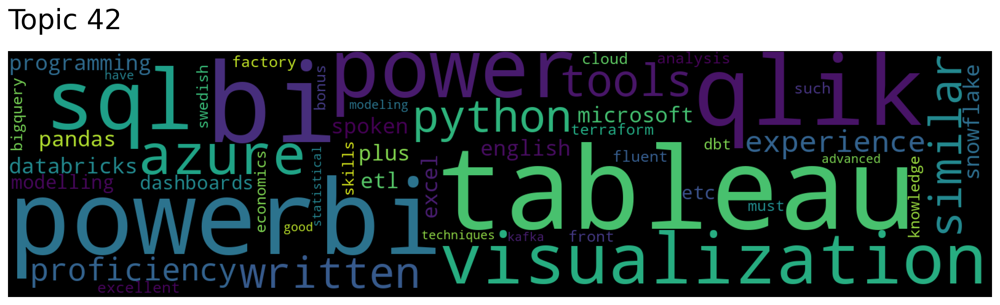

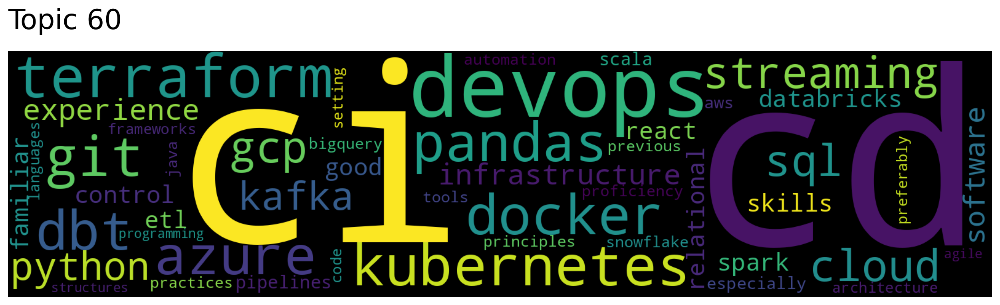

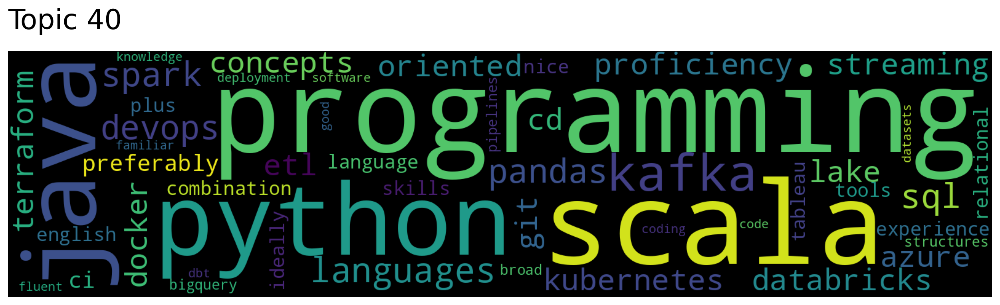

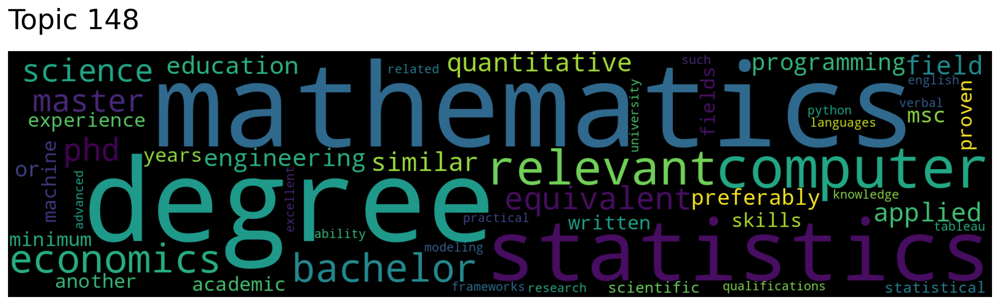

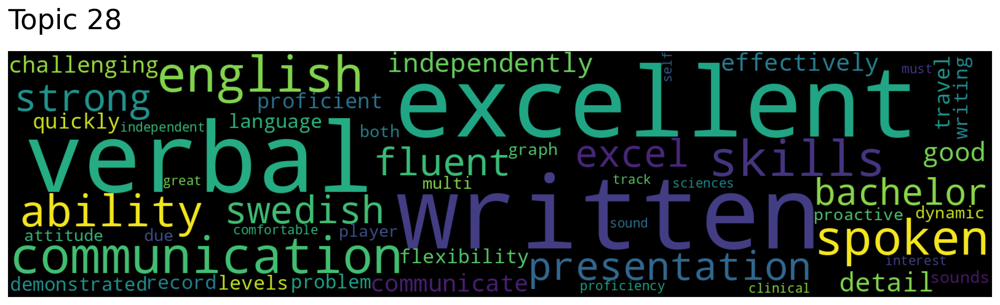

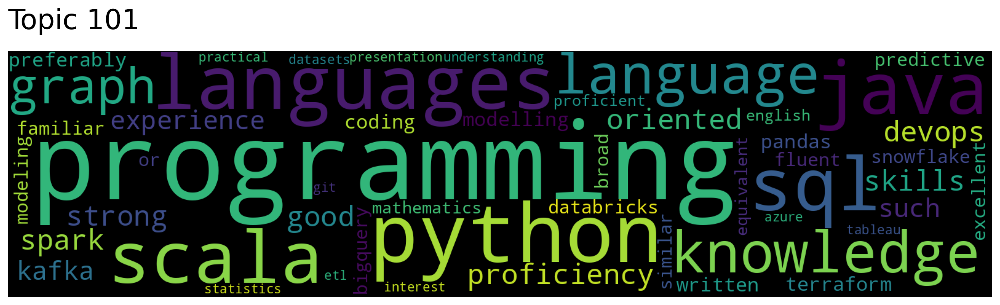

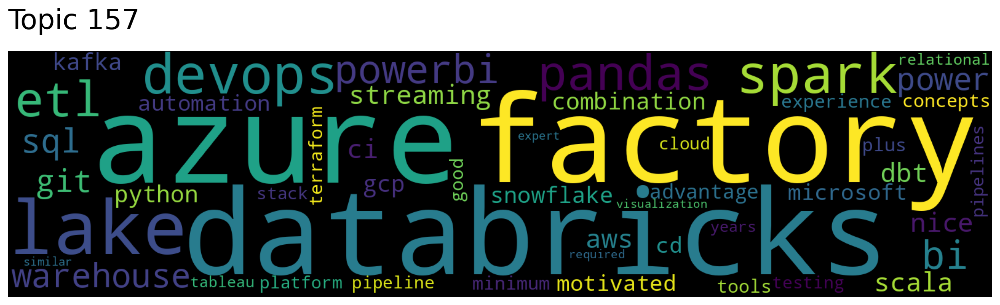

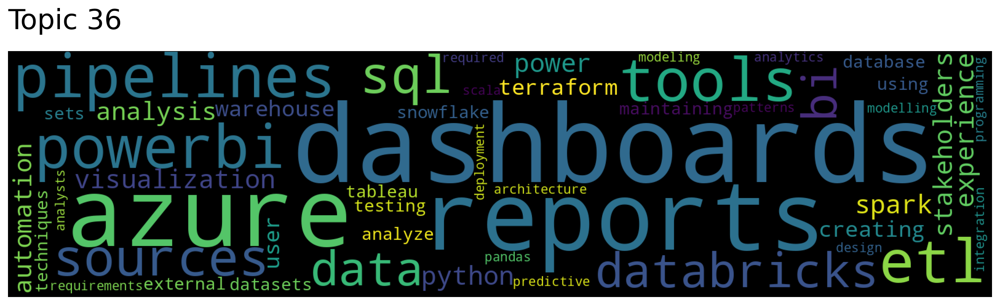

In [31]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["skills","tools"],num_topics=10)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

In [32]:
topics_reduced = model.hierarchical_topic_reduction(num_topics=15)

AttributeError: 'list' object has no attribute 'save'